# Introduction

This notebook builds on the first 5 notebooks in this series. In This final notebook, we use the result visualization framework established in notebook 5 and show how to automate its application to entire sweep campaigns.

In [1]:
import sys
from pathlib import Path

In [2]:
# set some paths. These will be relative to the current working directory, which is the same directory this notebook is in
picklePath = Path.cwd() / "pickles"
videoPath = Path.cwd() / "videos"

# Import functions

The functions created in notebook 5 have been moved to the polymer_adsorption_functions01.py file. We simply have to import them to access them.

In [3]:
from polymer_adsorption_functions01 import import_pickles, plot_result, encode_video_loop

CyRSoXS
Size of Real               : 4
Maximum Number Of Material : 32
 __________________________________________________________________________________________________
|                                 Thanks for using CyRSoXS                                        |
|--------------------------------------------------------------------------------------------------|
|  Copyright          : Iowa State University                                                      |
|  License            : NIST                                                                       |
|  Acknowledgement    : ONR MURI                                                                   |
|                                                                                                  |
|  Developed at Iowa State University in collaboration with NIST                                   |
|                                                                                                  |
|  Please cite the fol

## Define lists to import

In [4]:
# these are based on our procedural names:
sweep_names = [
    "tutorial_ssweeps_radius_nm",
    "tutorial_ssweeps_S0",
    "tutorial_ssweeps_S_slope_per_nm",
]

['/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_00.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_01.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_02.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_03.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_04.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_05.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_06.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_07.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_08.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_09.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_radius_nm_10.pkl',
 '/homes/deand/polymer_adsorptio

100%|██████████| 16/16 [00:00<00:00, 32.12it/s]
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtw

['/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_00.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_01.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_02.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_03.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_04.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_05.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_06.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_07.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_08.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_09.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_10.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S0_11.pkl',
 '/homes/deand/polymer_adsor

100%|██████████| 16/16 [00:00<00:00, 32.52it/s]
/homes/deand/polymer_adsorption_on_sphere/polymer_adsorption_functions01.py:309: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.subplots(figsize=(h_size, v_size), dpi=dpi)
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-l

['/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_00.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_01.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_02.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_03.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_04.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_05.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_06.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_07.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_08.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S_slope_per_nm_09.pkl',
 '/homes/deand/polymer_adsorption_on_sphere/pickles/tutorial_ssweeps_S

100%|██████████| 16/16 [00:00<00:00, 32.59it/s]
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtw

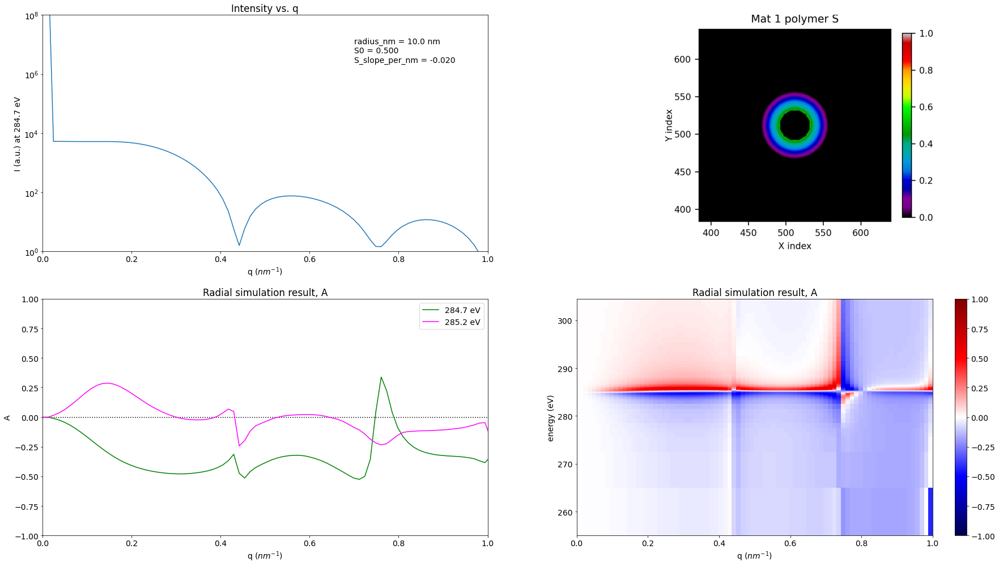

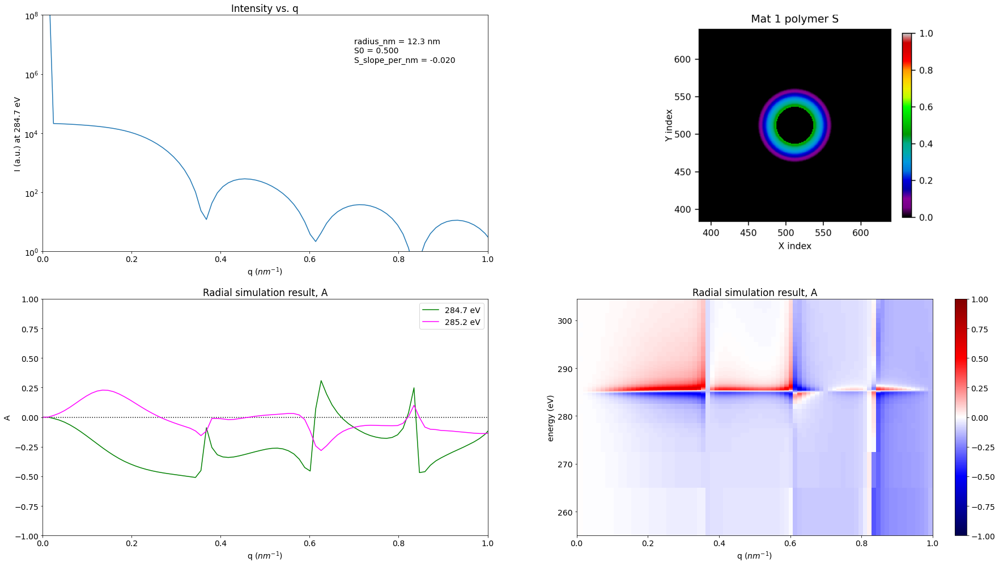

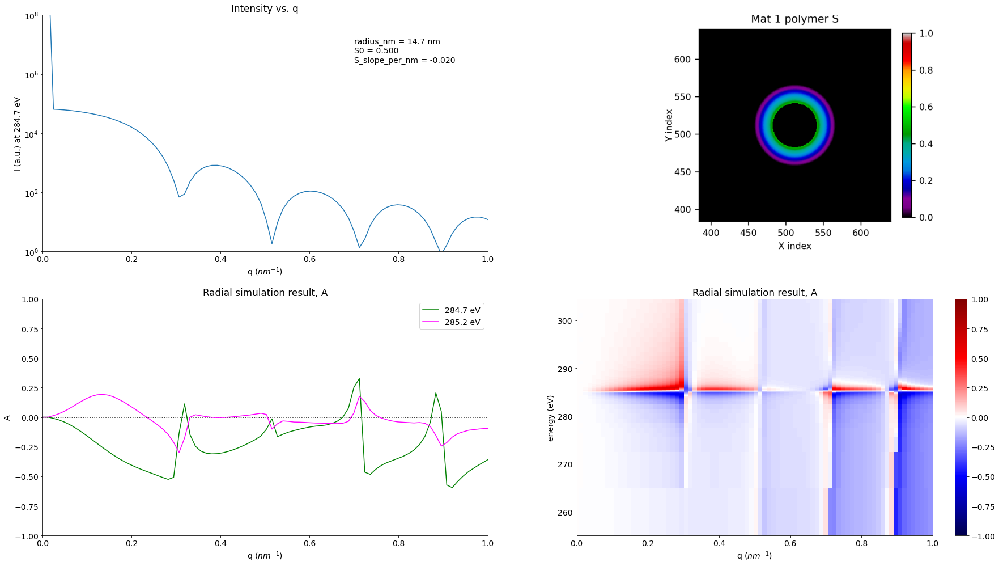

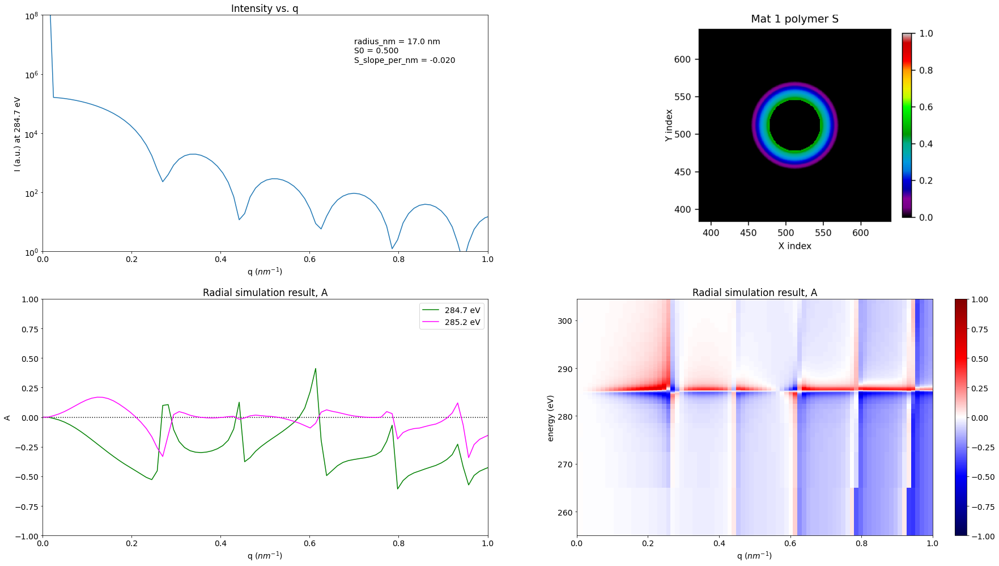

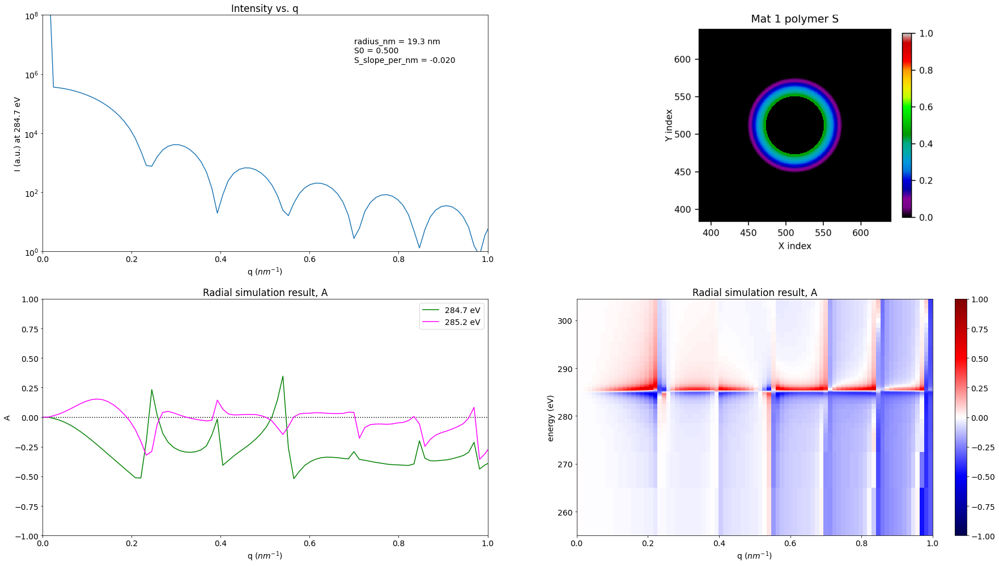

...

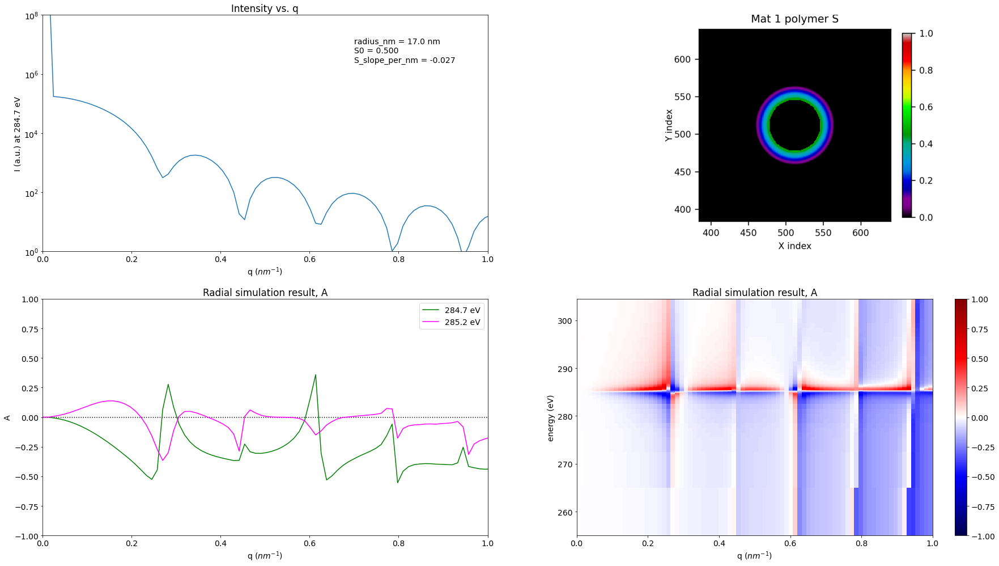

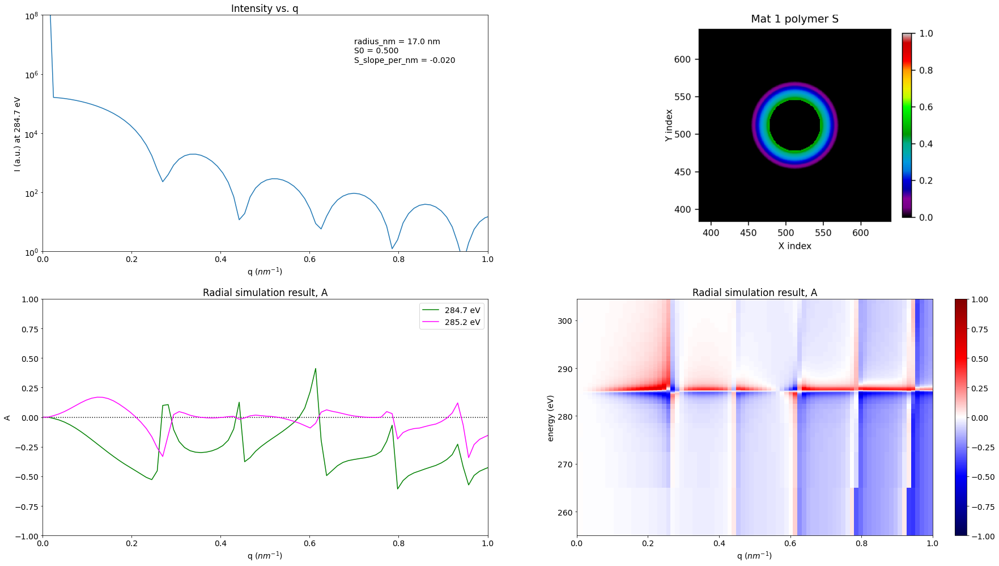

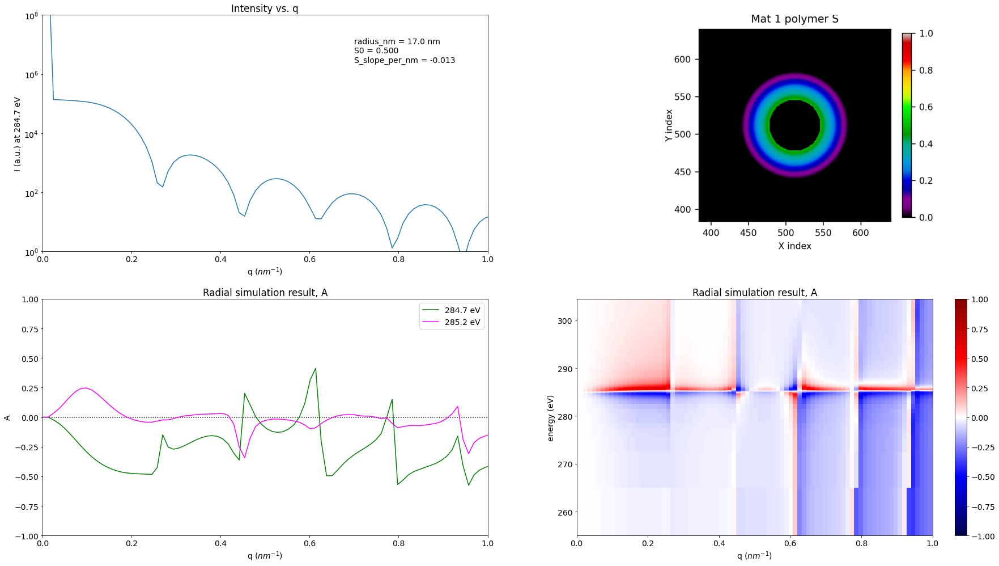

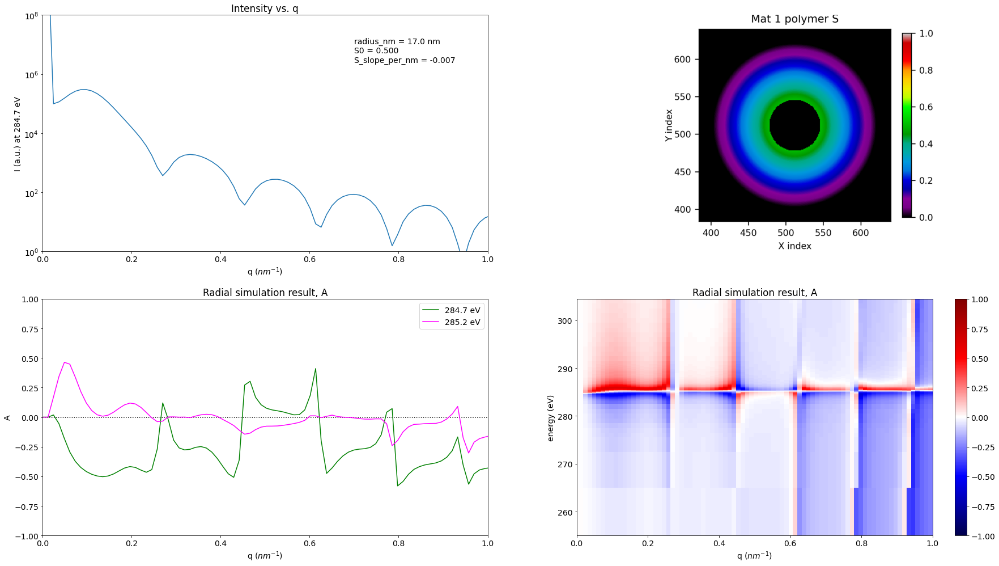

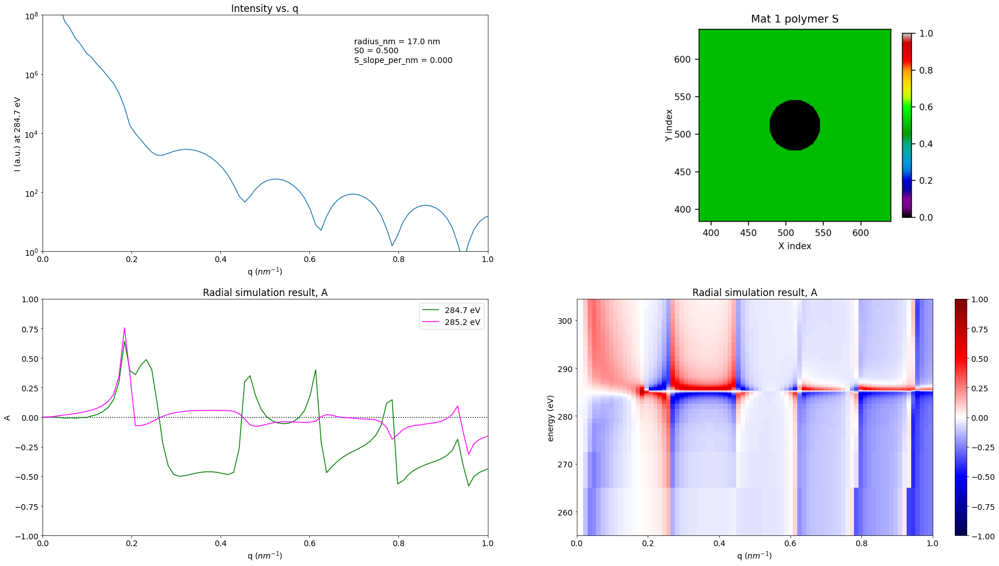

In [5]:
for sweep_name in sweep_names:
    results = import_pickles(picklePath, sweep_name)
    frames = []
    for result in results:
        frames.append(plot_result(result))
    # the f-string below changes the name of the video to include the name of the sweep
    encode_video_loop(frames, videoPath / f'{sweep_name}.mp4', frame_rate = 5, loops = 1)   